# import the essential packages

In [1]:
import numpy as np
import cv2
import glob
import os
import matplotlib.image as mpimg
import pickle
import matplotlib.pyplot as plt


# First, I'll compute the camera calibration using chessboard images

In [2]:
images = glob.glob('camera_cal/calibration*.jpg')
imagess = [] 
for i in range(len(os.listdir('./camera_cal'))):
    imagess.append(mpimg.imread('./camera_cal' + '/' + os.listdir('./camera_cal')[i]))

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
output_calibration =[]
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
    # Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        output_calibration.append(cv2.drawChessboardCorners(img, (9,6), corners, ret))    
cv2.destroyAllWindows()


# visualize camera calibration

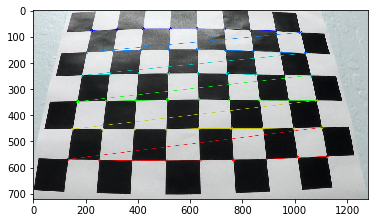

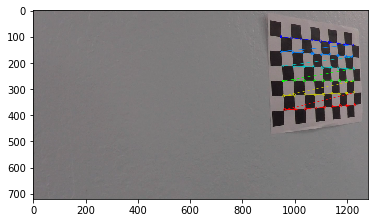

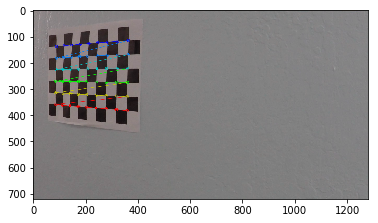

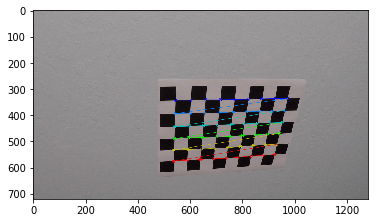

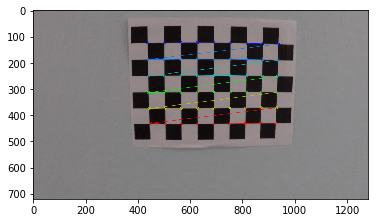

...

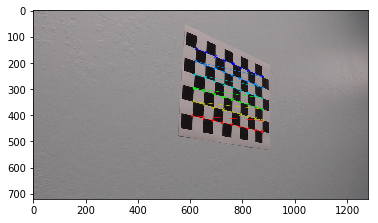

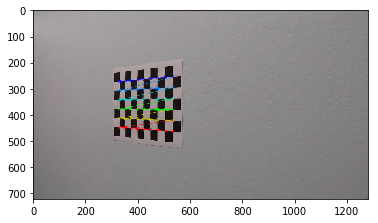

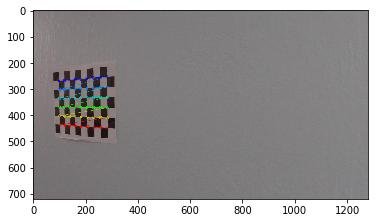

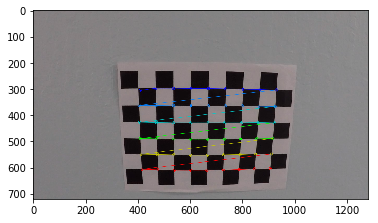

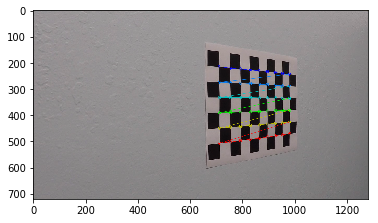

In [3]:
for i in range(len(output_calibration)):
    plt.imshow(output_calibration[i])
    plt.show()
 

# visualize camera calibration

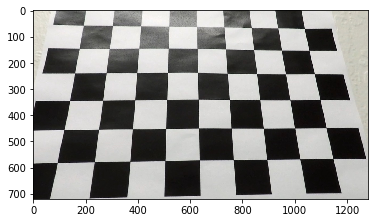

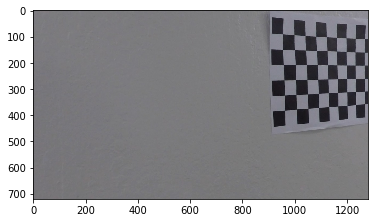

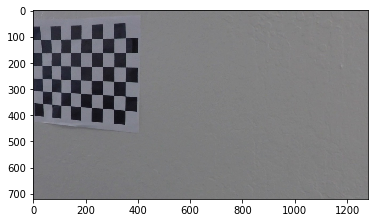

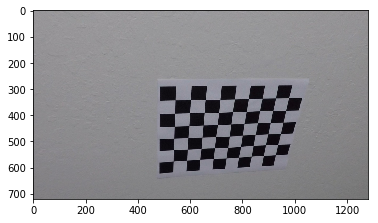

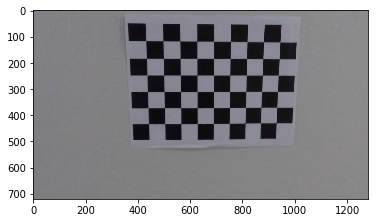

...

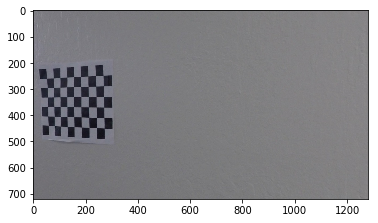

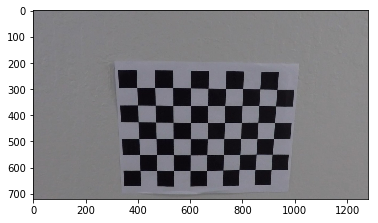

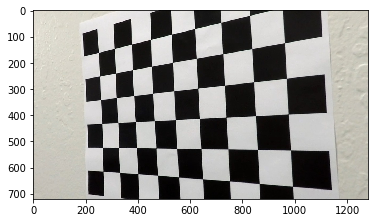

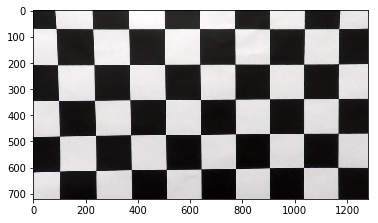

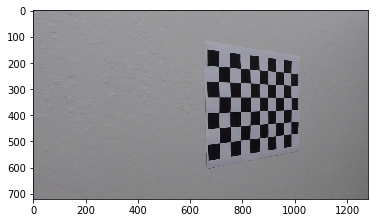

In [4]:
for i in range(len(imagess)):
    img_size = (imagess[i].shape[1], imagess[i].shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(imagess[i], mtx, dist, None, mtx)
    plt.imshow(dst)
    plt.show()
 


# Apply Bird view transform on images 

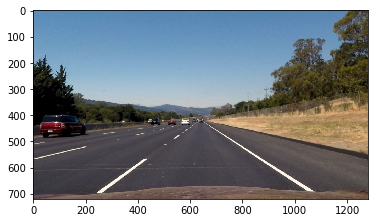

Warped image


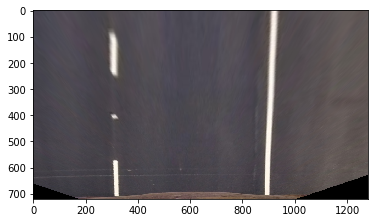

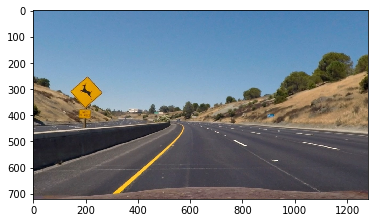

Warped image


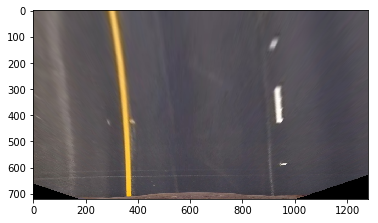

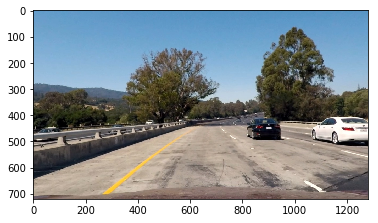

Warped image


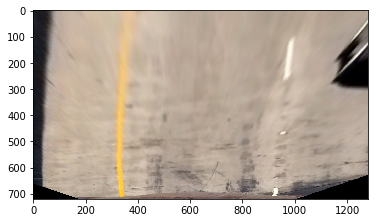

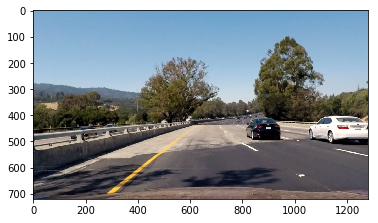

Warped image


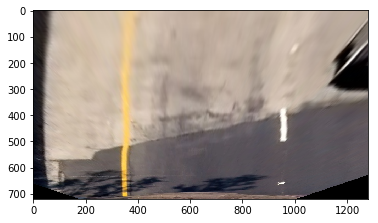

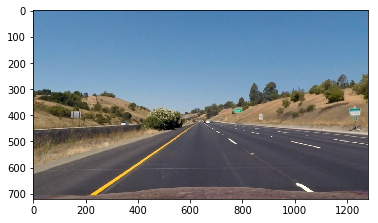

Warped image


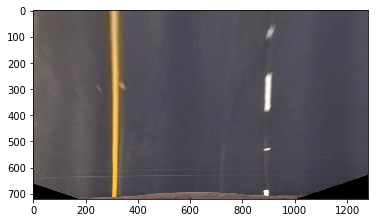

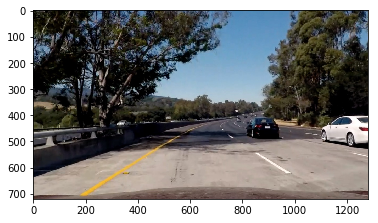

Warped image


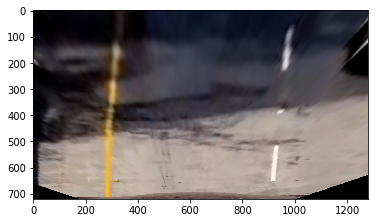

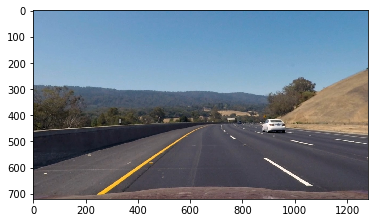

Warped image


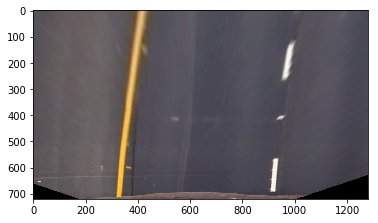

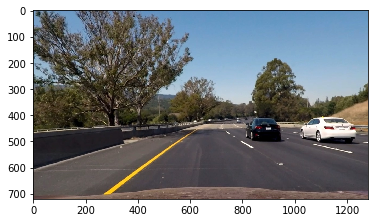

Warped image


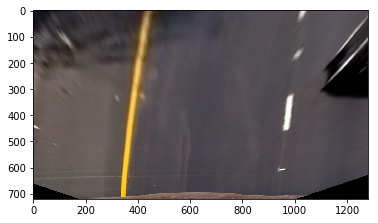

In [5]:
images_warp=[]
for i in range(len(os.listdir('./test_images'))):
    images_warp.append(mpimg.imread('./test_images' + '/' + os.listdir('./test_images')[i]))


for i in range(len(images_warp)):
    img_size = (images_warp[i].shape[1], images_warp[i].shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    images_warp[i] = cv2.undistort(images_warp[i], mtx, dist, None, mtx)  

    
src = np.float32([
        [220,  720],
        [1150, 720],
        [570,  470],
        [720,  470]
    ])
    
dst = np.float32([
        [320,  720],
        [920,  720],
        [320,    0],
        [920,    0] 
    ])
bird_images = [] 
for img in images_warp:
    img_size = (img.shape[1], img.shape[0]) 
    transform = cv2.getPerspectiveTransform(src,dst)
    bird_img = cv2.warpPerspective(img, transform, img_size)
    bird_images.append(bird_img)
    plt.imshow(img)
    plt.show()
    print("Warped image")
    plt.imshow(bird_img, cmap='gray')
    plt.show()



# Apply Sobel transform on images 

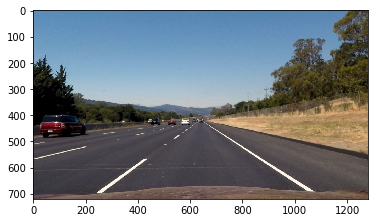

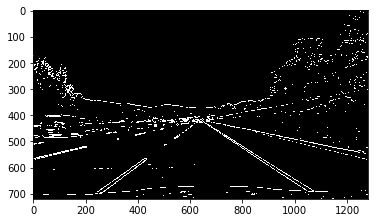

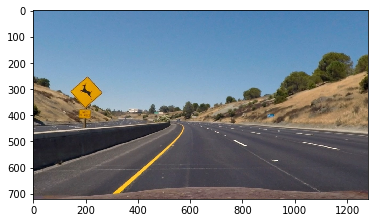

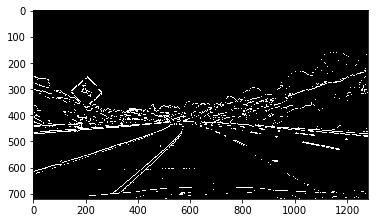

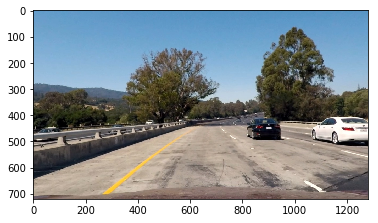

...

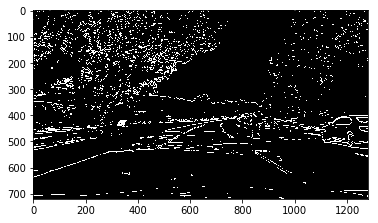

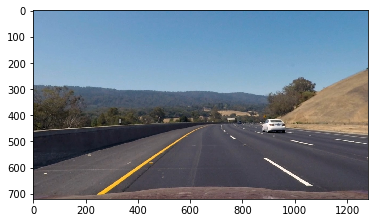

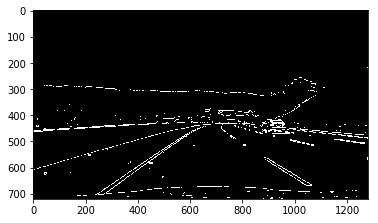

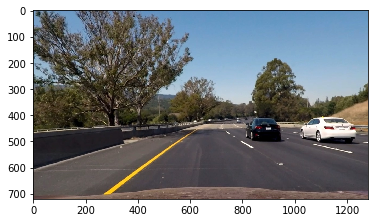

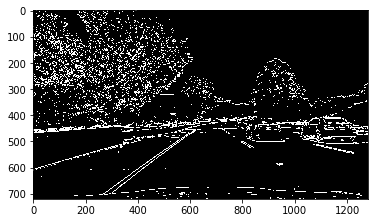

In [6]:

for image in  images_warp:
    gray = (cv2.cvtColor(image, cv2.COLOR_RGB2Lab))[:,:,0]
    sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    scaled_sobel = np.uint8(255*np.absolute(sobel)/np.max(np.absolute(sobel)))
    img_bin = np.zeros_like(scaled_sobel) 
    img_bin[(scaled_sobel >=  35) & (scaled_sobel <= 230)] = 1 
    plt.imshow(image)
    plt.show()
    plt.imshow(img_bin, cmap='gray')
    plt.show()


# Apply Sobel transform on images 

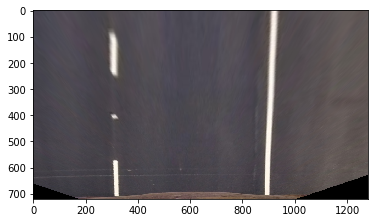

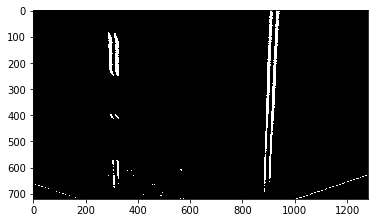

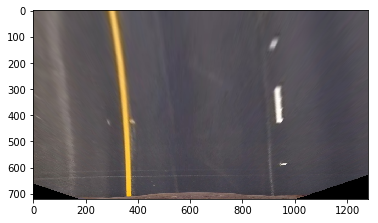

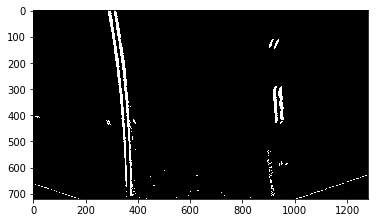

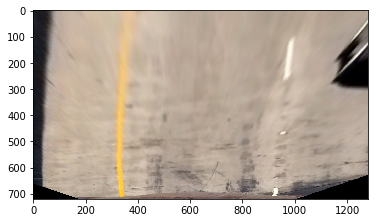

...

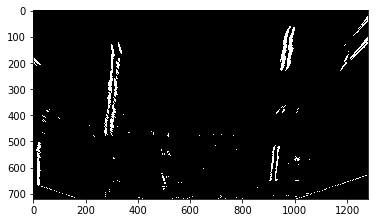

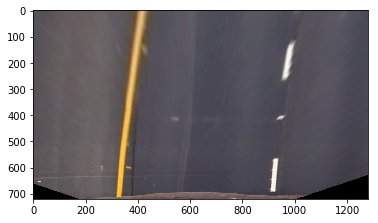

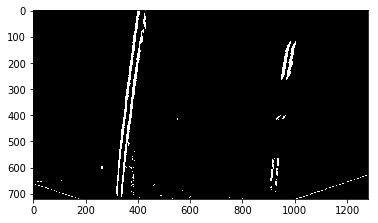

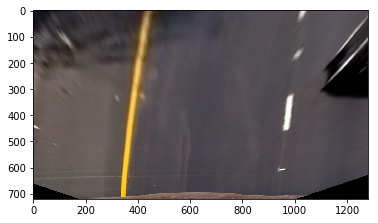

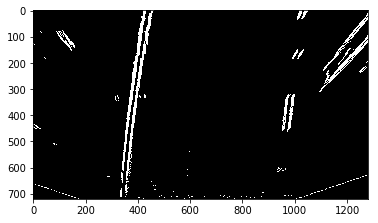

In [7]:
sob_out = [] 
for image in bird_images:
    gray = (cv2.cvtColor(image, cv2.COLOR_RGB2Lab))[:,:,0]
    sobel_out = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    scaled_sobel = np.uint8(255*np.absolute(sobel_out)/np.max(np.absolute(sobel_out)))
    img_bin = np.zeros_like(scaled_sobel) 
    img_bin[(scaled_sobel >= 25) & (scaled_sobel <= 150)] =1
    sob_out.append(img_bin)
    plt.imshow(image, cmap='gray')
    plt.show()
    plt.imshow(img_bin, cmap='gray')
    plt.show()


# Apply color filter on images 

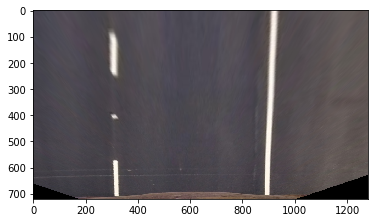

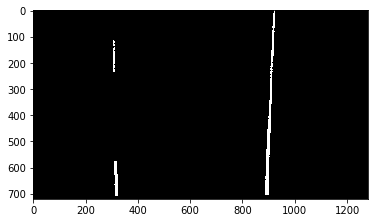

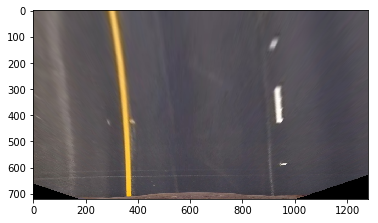

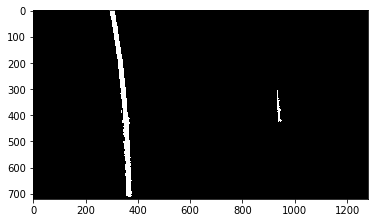

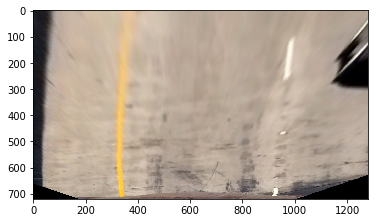

...

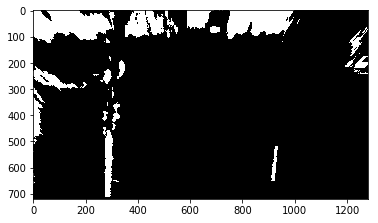

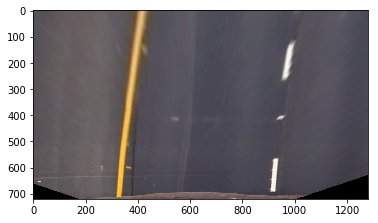

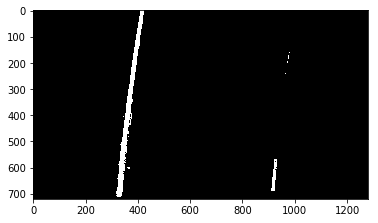

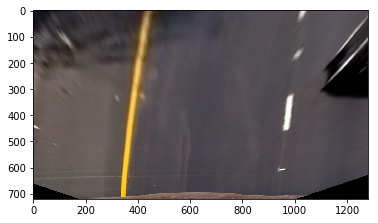

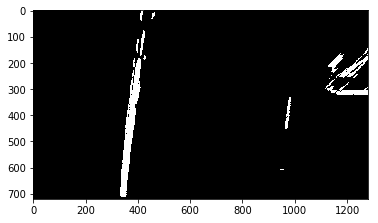

In [8]:
hls_out = [] 
for image in bird_images:
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:, :, 2]
    hls_bin = np.zeros_like(hls)
    hls_bin[(hls >= 125) & (hls <= 255)] = 1
    hls_out.append(hls_bin)
    plt.imshow(image)
    plt.show()
    plt.imshow(hls_bin, cmap='gray')
    plt.show()



# Apply color filter on images 

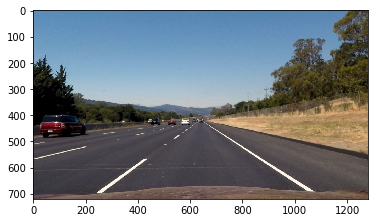

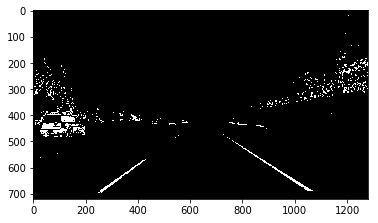

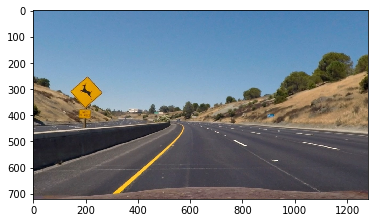

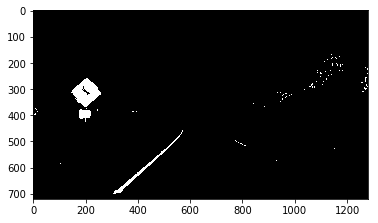

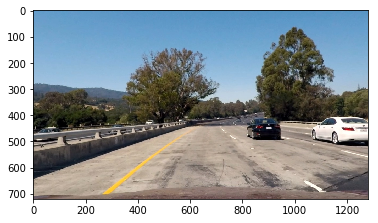

...

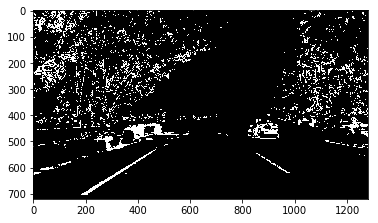

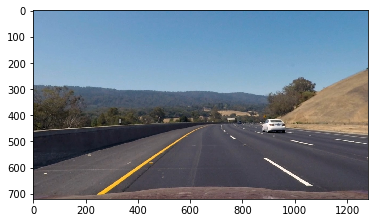

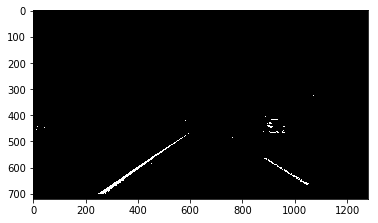

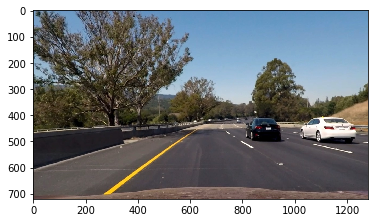

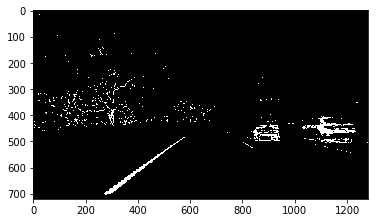

In [9]:
 for image in images_warp:
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:, :, 2]
    hls_bin = np.zeros_like(hls)
    hls_bin[(hls >= 160) & (hls <= 255)] = 1
    plt.imshow(image)
    plt.show()
    plt.imshow(hls_bin, cmap='gray')
    plt.show()



# apply both sobel and color filter on images 

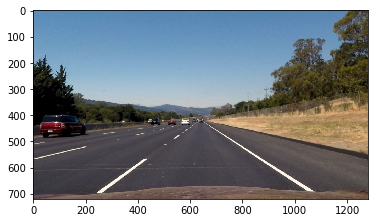

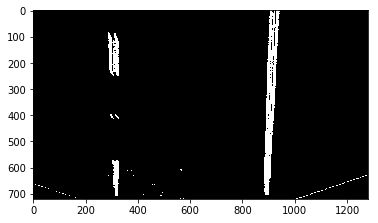

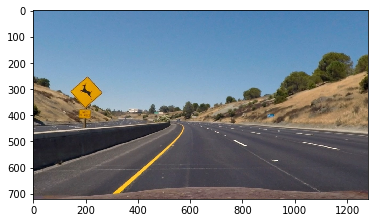

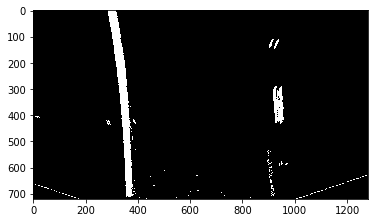

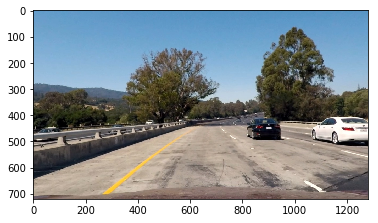

...

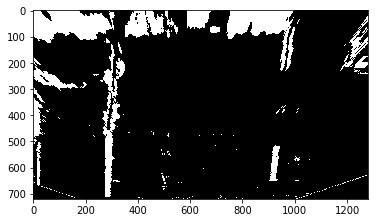

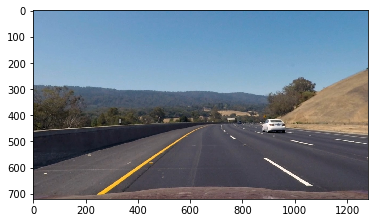

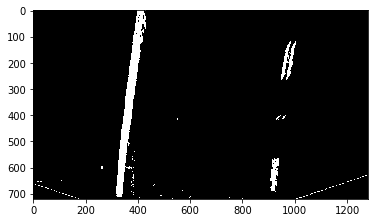

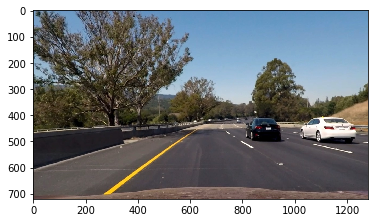

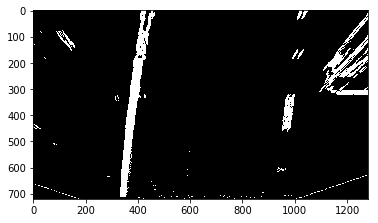

In [11]:
out_img = [] 
for i in range(len(hls_out)):
    img_out = np.zeros_like(sob_out[i])
    img_out[( hls_out[i] == 1) | (sob_out[i] == 1)] = 1
    plt.imshow(images_warp[i])
    out_img.append(img_out)
    plt.show()
    plt.imshow(img_out, cmap='gray')
    plt.show()

In [16]:
def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    return cv2.addWeighted(initial_img, α, img, β, γ)
changes = []
for i in range(len(out_img)):
    changes.append(weighted_img(out_img[i], images_warp[i]))


error: OpenCV(3.4.4) /io/opencv/modules/core/src/arithm.cpp:663: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'
